In [ ]:
# Download and extract the dataset
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces --unzip -p ./real_vs_fake_faces

# Verify that the dataset is downloaded
!ls ./real_vs_fake_faces

Dataset URL: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces
License(s): other
100% 3.74G/3.75G [00:42<00:00, 130MB/s]
100% 3.75G/3.75G [00:43<00:00, 93.0MB/s]
real_vs_fake  test.csv	train.csv  valid.csv


In [ ]:
# 1. Import Libraries
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# 2. Data Augmentation and Transformations
def create_transformations():
    train_transforms = transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
        transforms.RandomRotation(20),
        transforms.RandomPerspective(distortion_scale=0.3, p=0.3),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    test_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    return train_transforms, test_transforms

In [ ]:
# 3. Data Loading
def load_datasets(root_dir, train_transforms, test_transforms):
    train_dataset = datasets.ImageFolder(
        os.path.join(root_dir, 'train'),
        transform=train_transforms
    )
    val_dataset = datasets.ImageFolder(
        os.path.join(root_dir, 'valid'),
        transform=test_transforms
    )
    test_dataset = datasets.ImageFolder(
        os.path.join(root_dir, 'test'),
        transform=test_transforms
    )

    return train_dataset, val_dataset, test_dataset

def create_data_loaders(datasets, batch_size=32):
    train_loader = DataLoader(datasets[0], batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(datasets[1], batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(datasets[2], batch_size=batch_size, shuffle=False)

    return {
        'train': train_loader,
        'val': val_loader,
        'test': test_loader
    }

def print_dataset_stats(datasets):
    names = ['Train', 'Validation', 'Test']
    for name, dataset in zip(names, datasets):
        print(f"{name} Dataset:")
        print(f"Total Images: {len(dataset)}")
        print(f"Class Distribution: {dataset.class_to_idx}")
        print("Class Counts:",
              {dataset.classes[i]: count for i, count in
               enumerate(np.bincount(dataset.targets))})
        print()

In [ ]:
# 4. Model Architecture
class CustomVisionTransformer(nn.Module):
    def __init__(self, image_size=224, patch_size=16, dim=768, depth=12, heads=12, mlp_dim=3072, dropout=0.1):
        super(CustomVisionTransformer, self).__init__()
        assert image_size % patch_size == 0, "Image size must be divisible by patch size"
        self.patch_size = patch_size
        self.num_patches = (image_size // patch_size) ** 2
        self.patch_dim = 3 * patch_size ** 2
        self.dim = dim

        self.patch_embed = nn.Linear(self.patch_dim, dim)
        self.pos_embed = nn.Parameter(torch.randn(1, self.num_patches + 1, dim))
        self.class_token = nn.Parameter(torch.randn(1, 1, dim))
        self.dropout = nn.Dropout(dropout)

        self.transformer = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model=dim, nhead=heads, dim_feedforward=mlp_dim, dropout=dropout),
            num_layers=depth
        )
        self.mlp_head = nn.Sequential(nn.LayerNorm(dim), nn.Linear(dim, dim))

    def forward(self, x):
        batch_size, channels, height, width = x.size()
        x = x.unfold(2, self.patch_size, self.patch_size).unfold(3, self.patch_size, self.patch_size)
        x = x.contiguous().view(batch_size, -1, self.patch_dim)
        x = self.patch_embed(x)

        cls_tokens = self.class_token.expand(batch_size, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.pos_embed
        x = self.dropout(x)
        x = self.transformer(x)
        return self.mlp_head(x[:, 0])

# CNN architecture, just named the class in this way
class EnhancedResNet(nn.Module):
    def __init__(self, resnet_out_dim=2048):
        super(EnhancedResNet, self).__init__()
        self.resnet_features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.Sequential(
                nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(128, resnet_out_dim, kernel_size=3, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.AdaptiveAvgPool2d((1, 1))
            )
        )

    def forward(self, x):
        return self.resnet_features(x).view(x.size(0), -1)

class ViTResNetClassifier(nn.Module):
    def __init__(self, image_size=224, patch_size=16, num_classes=2,
                 vit_dim=768, resnet_out_dim=2048):
        super().__init__()
        self.vit = CustomVisionTransformer(
            image_size=image_size,
            patch_size=patch_size,
            dim=vit_dim
        )
        self.resnet = EnhancedResNet(resnet_out_dim=resnet_out_dim)

        combined_features = vit_dim + resnet_out_dim
        self.fc = nn.Sequential(
            nn.Linear(combined_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.6),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        vit_out = self.vit(x)
        resnet_out = self.resnet(x)
        combined_out = torch.cat((vit_out, resnet_out), dim=1)
        return self.fc(combined_out)

In [ ]:
# 5. Custom Loss Functions
class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        BCE_loss = nn.functional.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss
        return torch.mean(F_loss)

def visualize_random_images(model, val_loader, device, num_images=10):
    model.eval()
    class_names = val_loader.dataset.classes

    # Select random images
    indices = np.random.randint(0, len(val_loader.dataset), num_images)

    plt.figure(figsize=(15, 6))
    for i, idx in enumerate(indices):
        image, true_label = val_loader.dataset[idx]
        image = image.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(image)
            _, pred_label = torch.max(output, 1)

        plt.subplot(2, 5, i+1)
        plt.imshow(image.cpu().squeeze().permute(1, 2, 0).numpy())
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# 6. Plotting Function
def plot_training_history(history):
    epochs = range(1, len(history["train_loss"]) + 1)

    # Plot Training Accuracy and Loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Training Loss")
    plt.plot(epochs, history["train_acc"], label="Training Accuracy")
    plt.title("Training Accuracy and Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss / Accuracy")
    plt.legend()

    # Plot Validation Accuracy and Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.title("Validation Accuracy and Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss / Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

Train Dataset:
Total Images: 100000
Class Distribution: {'fake': 0, 'real': 1}
Class Counts: {'fake': 50000, 'real': 50000}

Validation Dataset:
Total Images: 20000
Class Distribution: {'fake': 0, 'real': 1}
Class Counts: {'fake': 10000, 'real': 10000}

Test Dataset:
Total Images: 20000
Class Distribution: {'fake': 0, 'real': 1}
Class Counts: {'fake': 10000, 'real': 10000}



c:\Users\Nihal Pratap\Downloads\mld project\.venv\lib\site-packages\torch\nn\modules\transformer.py:379: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(


Epoch 1/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.5528543].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5179958].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2146587].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4482791].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.077

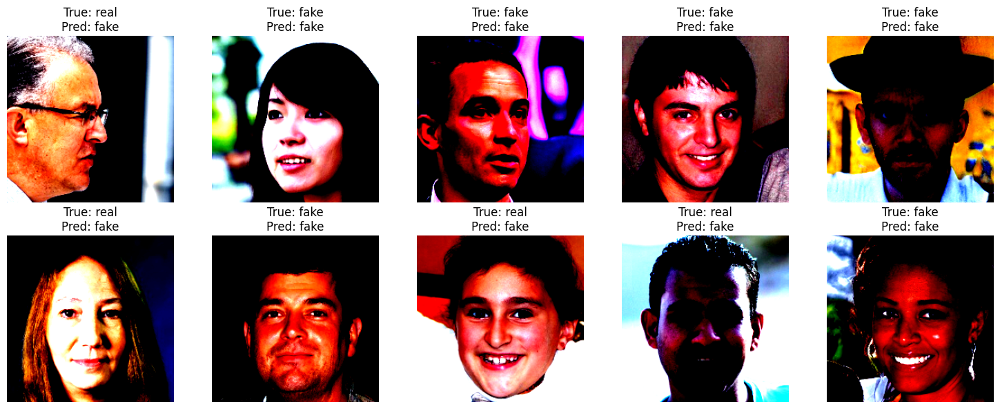

train Loss: 0.1936 Accuracy: 0.5497


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8267832..2.535425].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656862..2.3088455].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.5179958].
Cl

val Loss: 0.1662 Accuracy: 0.5944
Epoch 2/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.1632845].


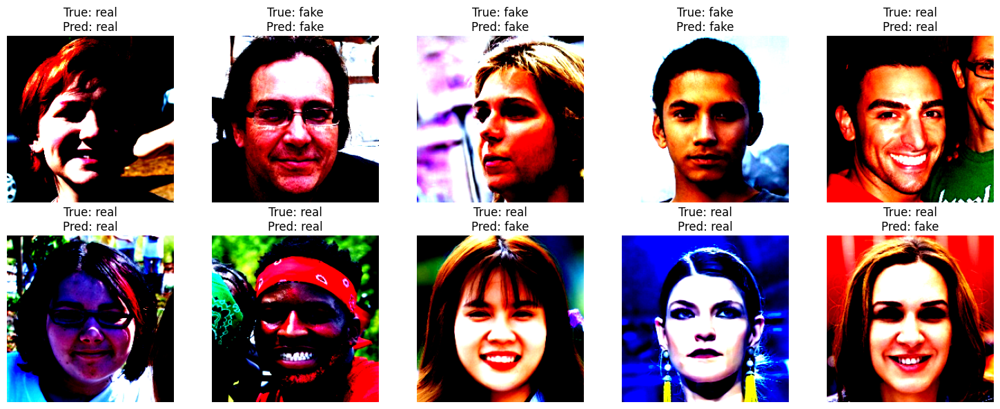

train Loss: 0.1591 Accuracy: 0.6438


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.9749122].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.465708].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7380952..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.4831376].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.4482791].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..2.3785

val Loss: 0.1467 Accuracy: 0.7016
Epoch 3/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.3262744].


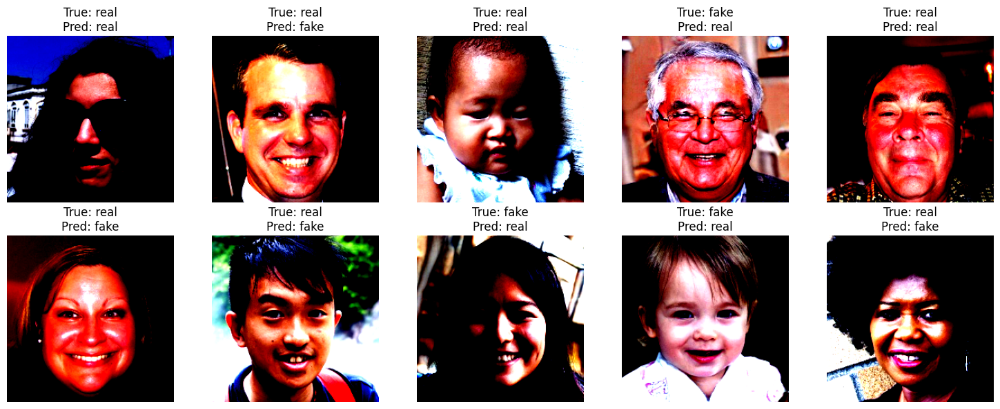

train Loss: 0.1475 Accuracy: 0.6947


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.4482791].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9466565..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.9776908].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1461596].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.3088

val Loss: 0.1604 Accuracy: 0.6863
Epoch 4/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.5005665].


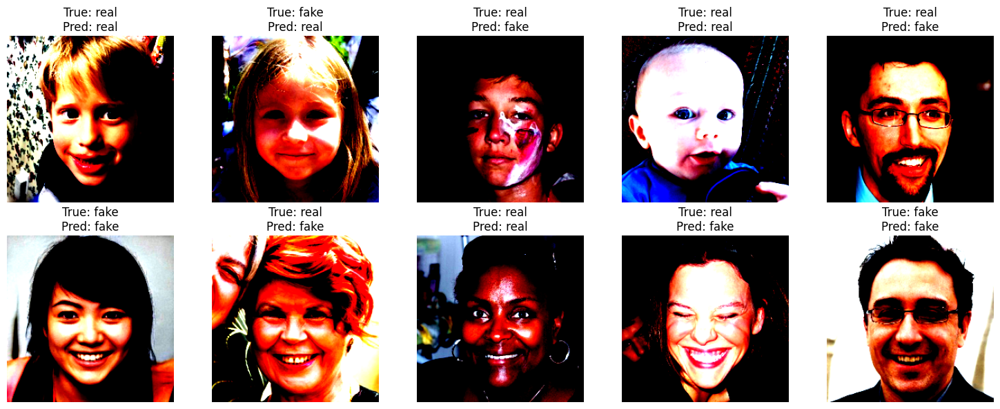

train Loss: 0.1387 Accuracy: 0.7251


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8431373..2.4482791].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..1.8382572].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.1519828].
Clippi

val Loss: 0.1250 Accuracy: 0.7662
Epoch 5/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.465708].


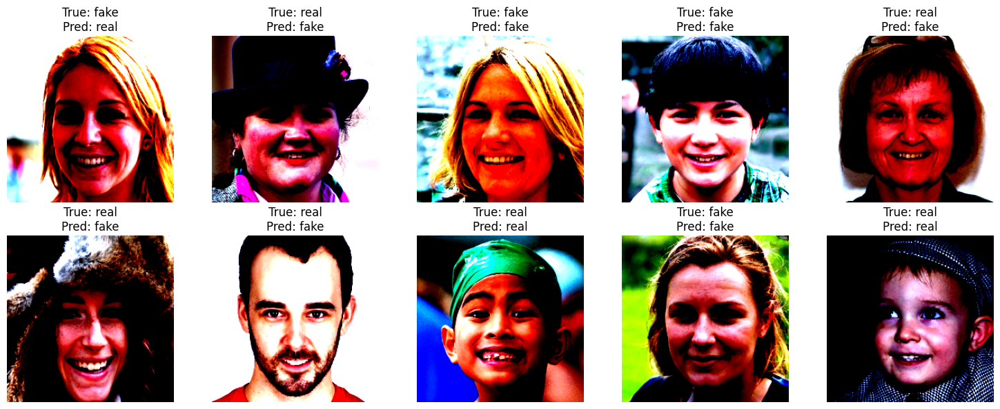

train Loss: 0.1314 Accuracy: 0.7470


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.465708].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6384109..2.5877128].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.3959913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2914162].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8606442..2.1

val Loss: 0.1182 Accuracy: 0.7832
Epoch 6/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..2.5702832].


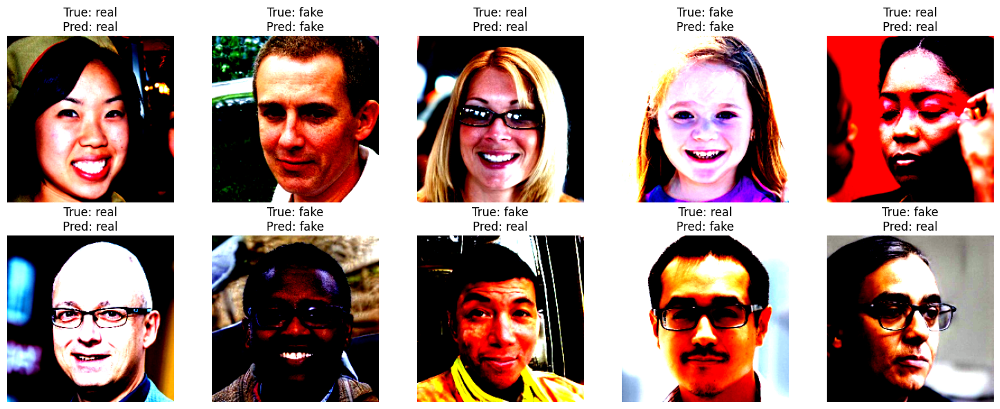

train Loss: 0.1241 Accuracy: 0.7687


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7205882..2.2146587].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656862..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9295317..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7380952..2.535425].


val Loss: 0.1139 Accuracy: 0.7940
Epoch 7/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5528543].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.64].


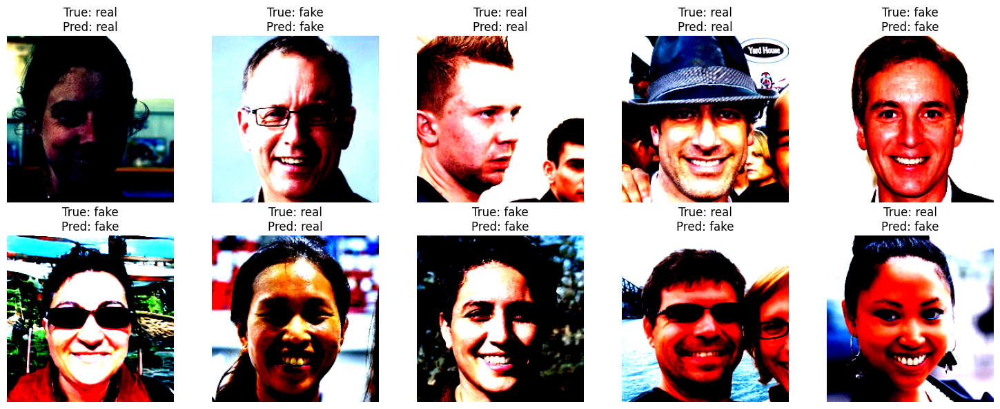

train Loss: 0.1180 Accuracy: 0.7853


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3611329].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2565577].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7411594..2.3262744].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.5125438].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2

val Loss: 0.1324 Accuracy: 0.7622
Epoch 8/20


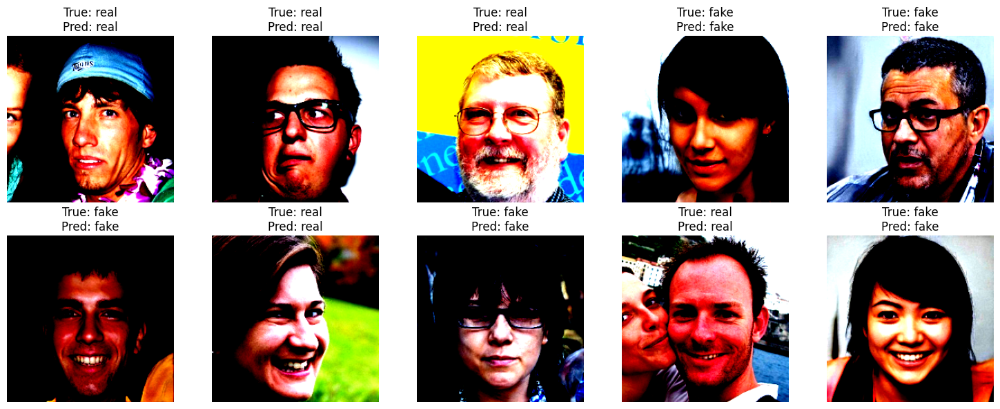

train Loss: 0.1119 Accuracy: 0.8007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..1.9749122].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.5179958].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.169412].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.5179958].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.2914162

val Loss: 0.1123 Accuracy: 0.7972
Epoch 9/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.5528543].


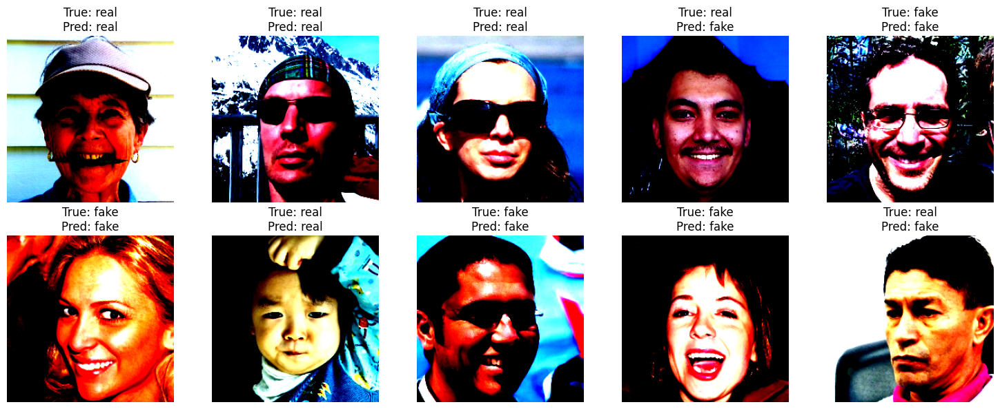

train Loss: 0.1063 Accuracy: 0.8138


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2391288].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656862..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.0947855].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5528543].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.3088455].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2

val Loss: 0.0872 Accuracy: 0.8539
Epoch 10/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821..2.64].


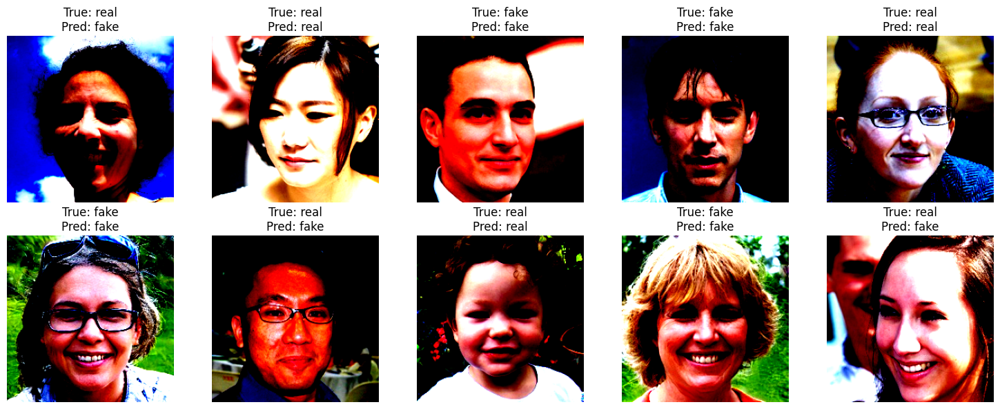

train Loss: 0.1018 Accuracy: 0.8242


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781574..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8952821..2.64].


val Loss: 0.0941 Accuracy: 0.8384
Epoch 11/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5005665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.2899221].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781512..1.6666666].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6555357..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.535425

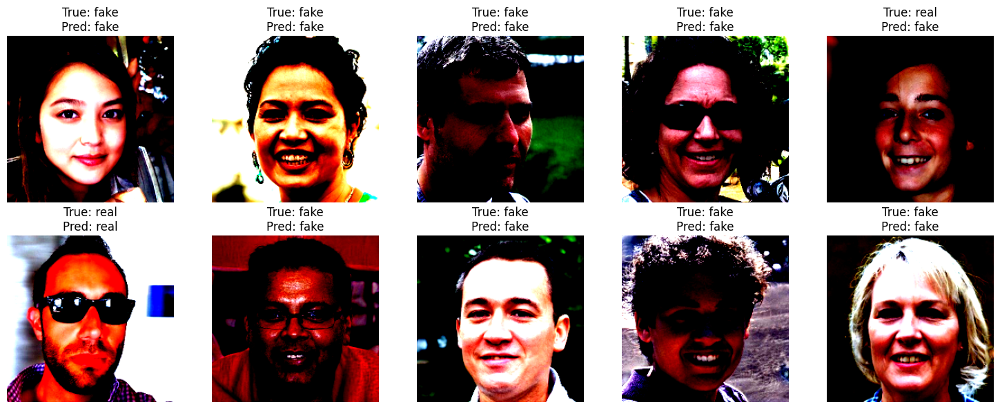

train Loss: 0.0969 Accuracy: 0.8342


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5005665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2009804].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9295317..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.64].
Clipping

val Loss: 0.1101 Accuracy: 0.8045
Epoch 12/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8956583..2.2739873].


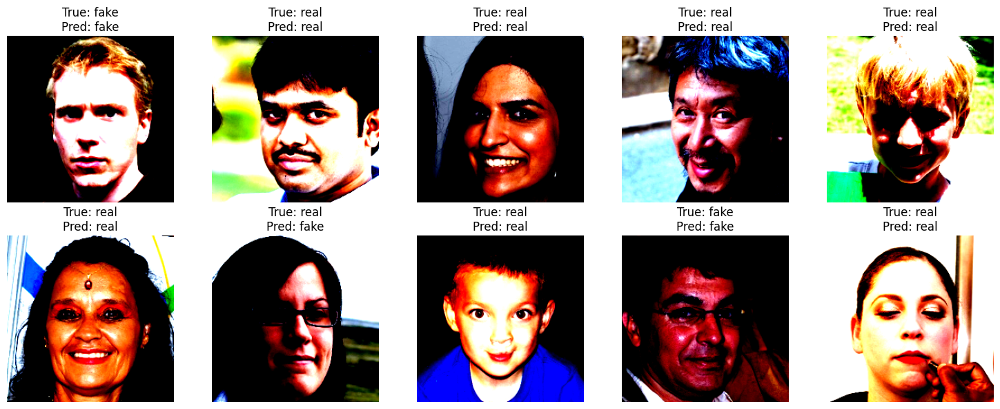

train Loss: 0.0926 Accuracy: 0.8433


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.5877128].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781512..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.5179958].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3262744].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.465708].
Clipp

val Loss: 0.1404 Accuracy: 0.7538
Epoch 13/20


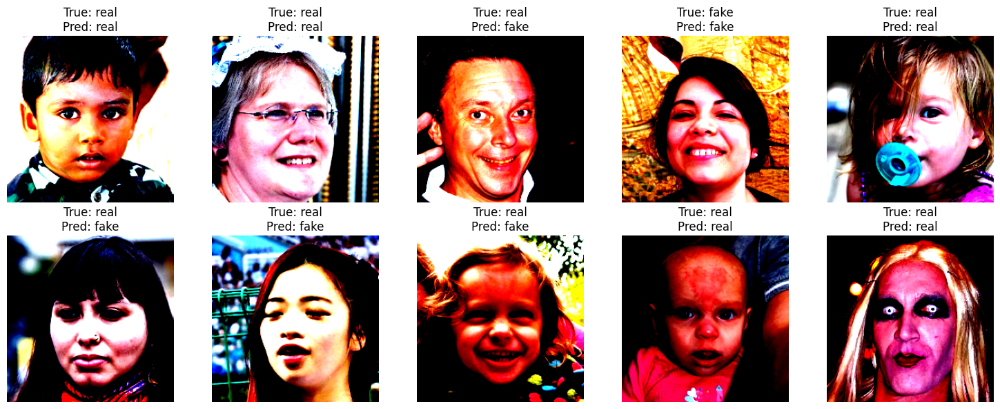

train Loss: 0.0889 Accuracy: 0.8513


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.0947855].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8267832..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..2.169412].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.43

val Loss: 0.0657 Accuracy: 0.8974
Epoch 14/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877128].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781512..2.64].


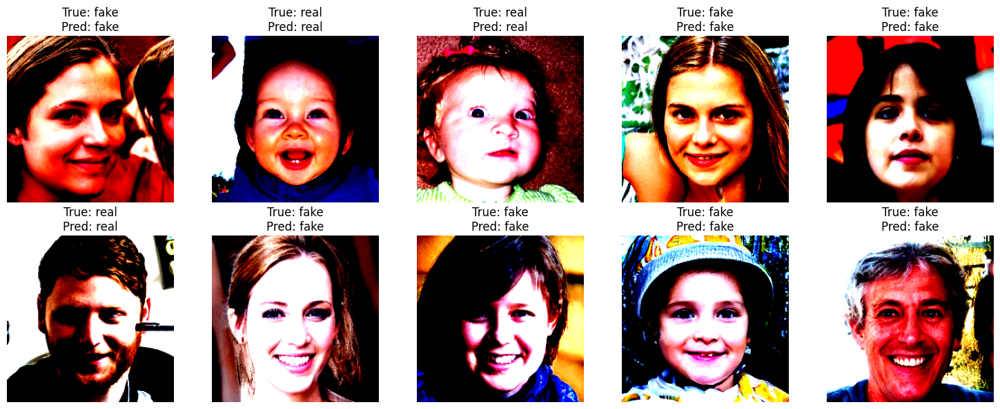

train Loss: 0.0851 Accuracy: 0.8588


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9295317..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.2146587].


val Loss: 0.0664 Accuracy: 0.8942
Epoch 15/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9131652..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.343704].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.3785625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..1.4782944].
Clipp

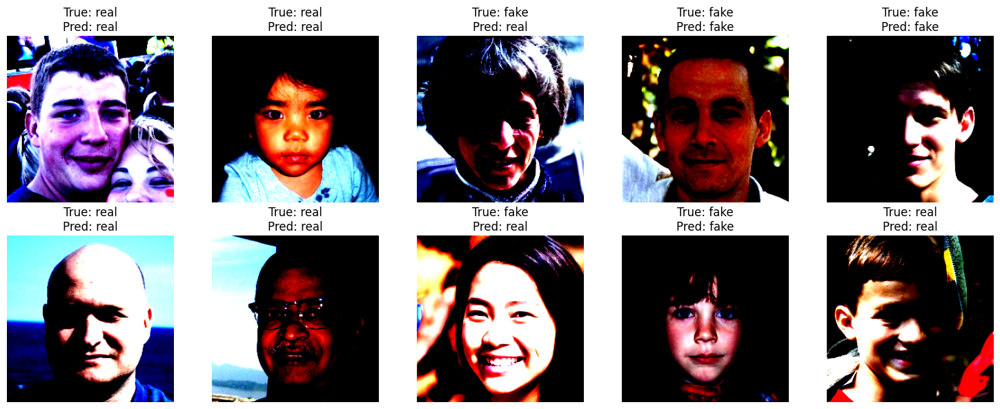

train Loss: 0.0821 Accuracy: 0.8650


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8606442..2.235994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..1.9951199].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9466565..2.1804092].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9656862..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8956583..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8431373..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.622

val Loss: 0.0674 Accuracy: 0.8908
Epoch 16/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.3935575].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7582842..2.64].


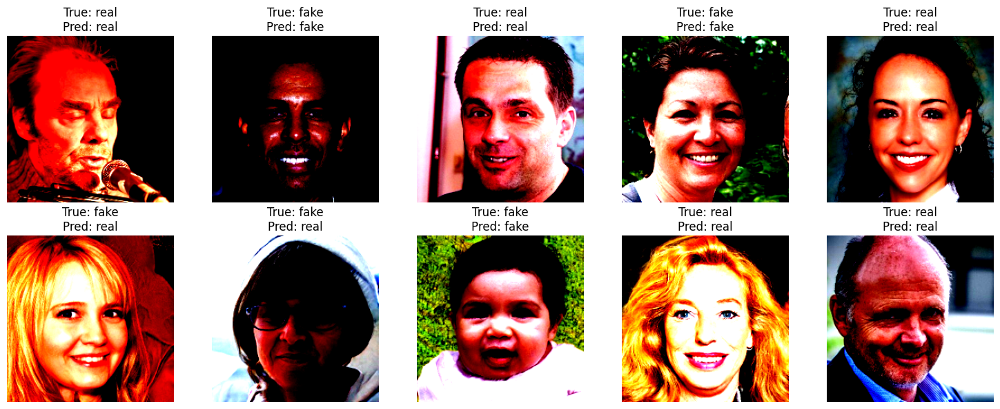

train Loss: 0.0791 Accuracy: 0.8705


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8431373..1.8379141].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7906162..2.3959913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9306722..2.535425].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4110641].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].

val Loss: 0.0586 Accuracy: 0.9099
Epoch 17/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8781574..2.2042704].


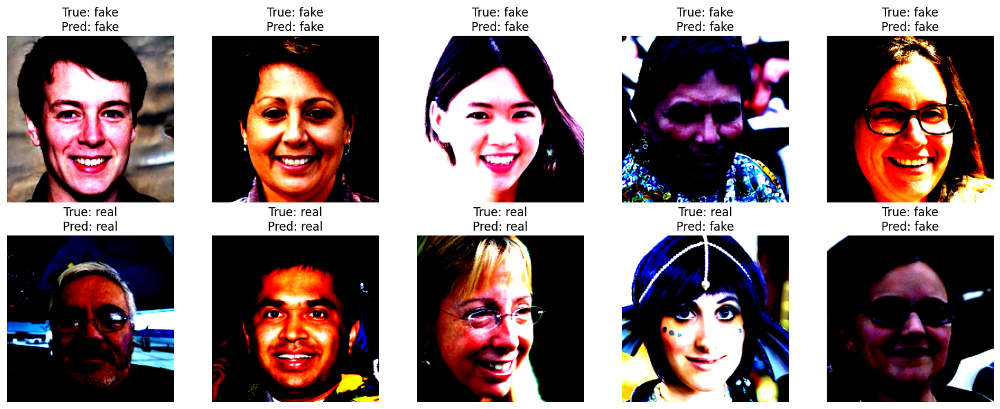

train Loss: 0.0764 Accuracy: 0.8763


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.1975338].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7731092..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8956583..2.6051416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.2565577].
Clippin

val Loss: 0.0548 Accuracy: 0.9187
Epoch 18/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.4831376].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


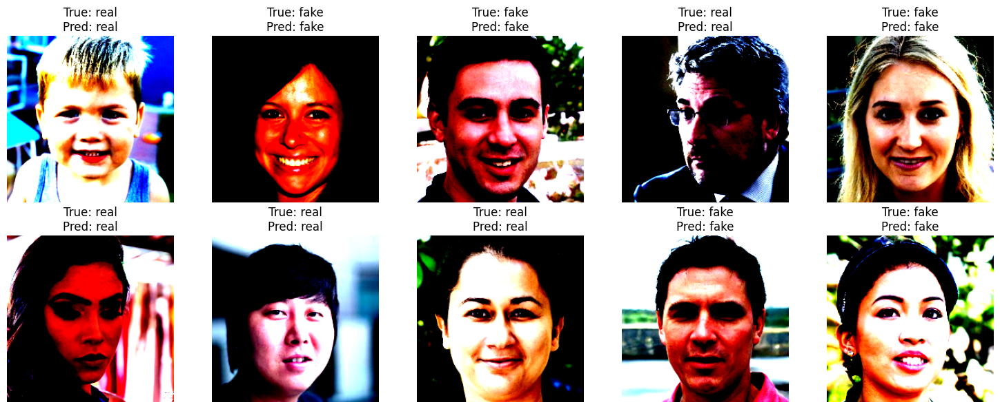

train Loss: 0.0732 Accuracy: 0.8821


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.2317834].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2489083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.060536].
Clipping i

val Loss: 0.0550 Accuracy: 0.9166
Epoch 19/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.1659663].


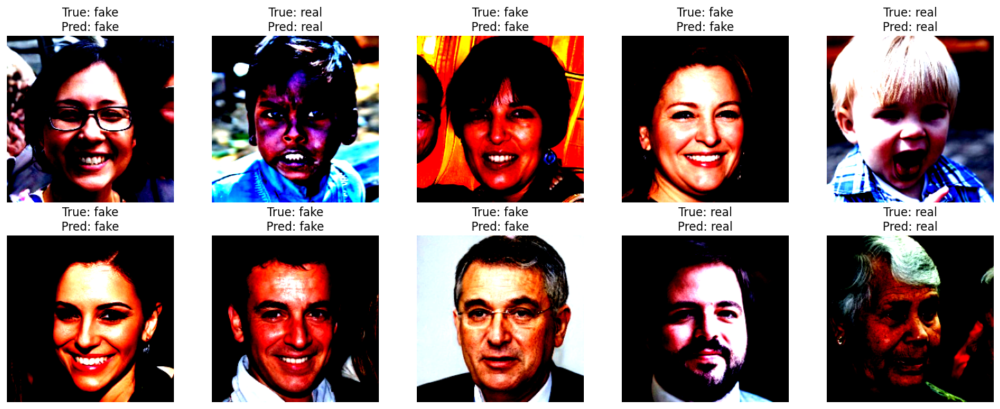

train Loss: 0.0706 Accuracy: 0.8878


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151556..2.169412].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0007002..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3611329].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..2.5005665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.535425].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9980307..2.5005665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4831

val Loss: 0.0524 Accuracy: 0.9200
Epoch 20/20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.465708].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5179958].


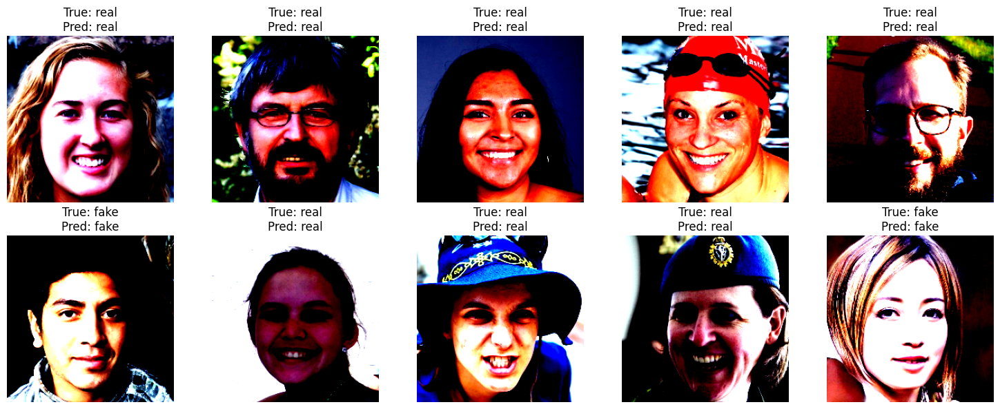

train Loss: 0.0688 Accuracy: 0.8902
val Loss: 0.0522 Accuracy: 0.9228


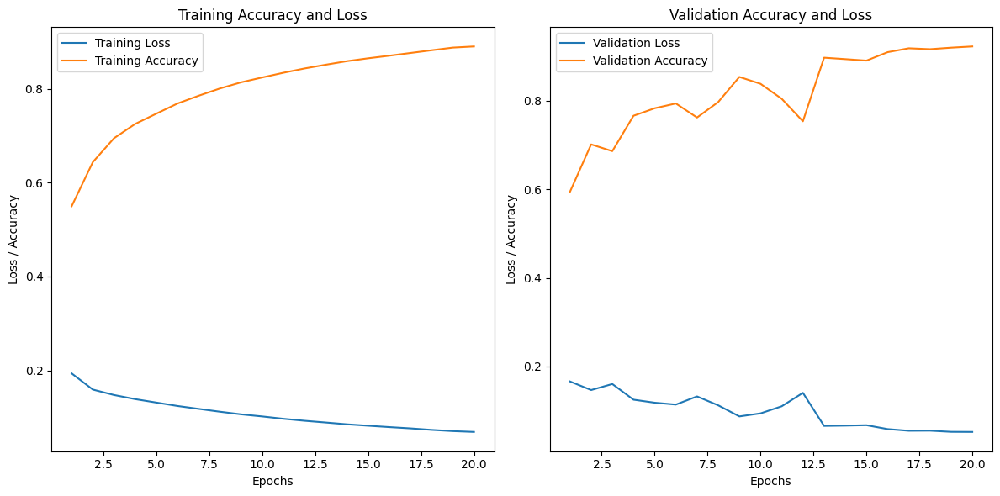

In [ ]:
# 7. Training Loop

def train_model(model, dataloaders, criterion, optimizer, scheduler, device, num_epochs=20):
    # Track metrics
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": []
    }
    best_val_acc = 0.0
    best_model_wts = model.state_dict()

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")

        # Visualization of random validation images
        visualize_random_images(model, dataloaders['val'], device)

        for phase in ['train', 'val']:
            model.train() if phase == 'train' else model.eval()

            running_loss = 0.0
            running_corrects = 0

            with torch.set_grad_enabled(phase == 'train'):
                for inputs, labels in dataloaders[phase]:
                    inputs, labels = inputs.to(device), labels.to(device)

                    optimizer.zero_grad()
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                    _, preds = torch.max(outputs, 1)
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print(f"{phase} Loss: {epoch_loss:.4f} Accuracy: {epoch_acc:.4f}")

            if phase == 'train':
                history["train_loss"].append(epoch_loss)
                history["train_acc"].append(epoch_acc.item())
            else:
                history["val_loss"].append(epoch_loss)
                history["val_acc"].append(epoch_acc.item())
                if epoch_acc > best_val_acc:
                    best_val_acc = epoch_acc
                    best_model_wts = model.state_dict()

        scheduler.step(epoch_loss)

    model.load_state_dict(best_model_wts)
    return model, history

def main():
    # Configuration
    root_dir = './real_vs_fake_faces/real_vs_fake/real-vs-fake'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Transformations
    train_transforms, test_transforms = create_transformations()

    # Datasets
    datasets = load_datasets(root_dir, train_transforms, test_transforms)
    print_dataset_stats(datasets)

    # Data Loaders
    dataloaders = create_data_loaders(datasets)

    # Model Setup
    model = ViTResNetClassifier().to(device)
    criterion = FocalLoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-3)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    # Training
    trained_model, history = train_model(model, dataloaders, criterion, optimizer, scheduler, device)
    torch.save(model.state_dict(), "vit_cnn_classifier_final_2dec.pth")

    # Plot Training History
    plot_training_history(history)

if __name__ == '__main__':
    main()

C:\Users\Nihal Pratap\AppData\Local\Temp\ipykernel_31628\3432270592.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('vit_cnn_classifie

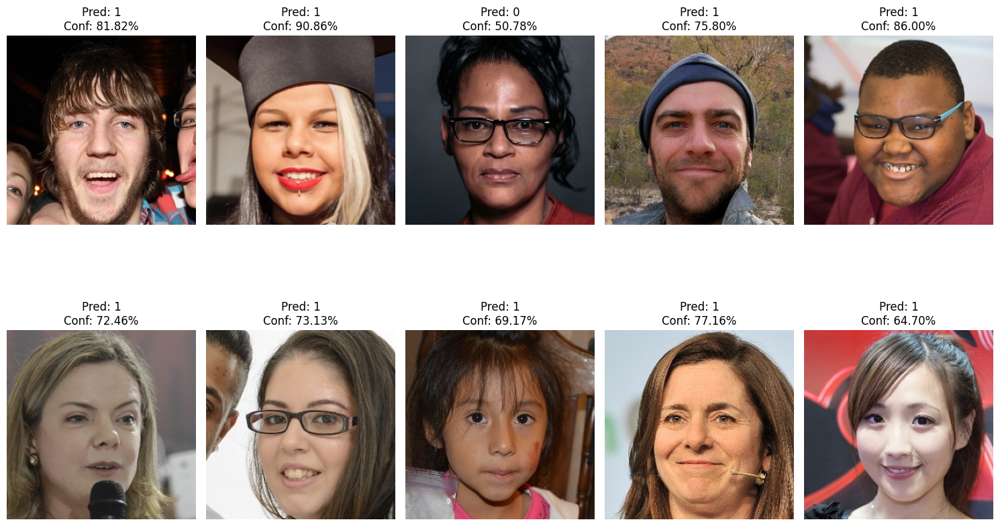


--- Prediction Report ---
Image: 46462.jpg
Predicted Class: Real
Confidence: 81.82%

Image: 32917.jpg
Predicted Class: Real
Confidence: 90.86%

Image: 46292.jpg
Predicted Class: Fake
Confidence: 50.78%

Image: 49173.jpg
Predicted Class: Real
Confidence: 75.80%

Image: 07706.jpg
Predicted Class: Real
Confidence: 86.00%

Image: 04905.jpg
Predicted Class: Real
Confidence: 72.46%

Image: 52848.jpg
Predicted Class: Real
Confidence: 73.13%

Image: 10750.jpg
Predicted Class: Real
Confidence: 69.17%

Image: 03936.jpg
Predicted Class: Real
Confidence: 77.16%

Image: 04064.jpg
Predicted Class: Real
Confidence: 64.70%



In [ ]:
# 8. Prediction
import os
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def predict_single_image(model, image_path, device, transform=None):
    # Use default transform if not provided
    if transform is None:
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

    # Load and preprocess the image
    model.eval()
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Perform prediction
    with torch.no_grad():
        output = model(input_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        predicted_class = torch.argmax(probabilities, dim=1).item()
        confidence = probabilities[0][predicted_class].item()

    return predicted_class, confidence, image

def predict_directory(model, directory_path, device, transform=None, top_n=10):

    # Find image files in the directory
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif']
    image_files = [
        os.path.join(directory_path, f)
        for f in os.listdir(directory_path)
        if os.path.splitext(f)[1].lower() in image_extensions
    ]

    # Randomly select top_n images
    np.random.shuffle(image_files)
    selected_images = image_files[:top_n]

    # Prediction results
    prediction_results = []

    # Create a figure for visualization
    plt.figure(figsize=(15, 10))

    # Prediction loop
    for i, image_path in enumerate(selected_images, 1):
        try:
            # Predict single image
            predicted_class, confidence, image = predict_single_image(
                model, image_path, device, transform
            )

            # Store prediction result
            prediction_results.append({
                'image_path': image_path,
                'predicted_class': predicted_class,
                'confidence': confidence
            })

            # Visualization
            plt.subplot(2, 5, i)
            plt.imshow(np.array(image))
            plt.title(f"Pred: {predicted_class}\nConf: {confidence:.2%}")
            plt.axis('off')

        except Exception as e:
            print(f"Error processing {image_path}: {e}")

    plt.tight_layout()
    plt.show()

    return prediction_results

def generate_detailed_report(prediction_results, class_names):
    print("\n--- Prediction Report ---")
    for result in prediction_results:
        print(f"Image: {os.path.basename(result['image_path'])}")
        print(f"Predicted Class: {class_names[result['predicted_class']]}")
        print(f"Confidence: {result['confidence']:.2%}\n")

def main():
    # Model and device setup
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = ViTResNetClassifier(
        image_size=224,
        patch_size=16,
        num_classes=2,
        vit_dim=768,
        resnet_out_dim=2048
    ).to(device)
    model.load_state_dict(torch.load('vit_cnn_classifier_final_2dec.pth'))
    model.eval()

    # Transformation
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

    # Class names
    class_names = ['Fake', 'Real']

    # Directory prediction example
    directory_path = './real_vs_fake_faces/real_vs_fake/real-vs-fake/test/real'
    prediction_results = predict_directory(
        model, directory_path, device, transform, top_n=10
    )

    # Generate detailed report
    generate_detailed_report(prediction_results, class_names)

if __name__ == '__main__':
    main()